In [0]:
 spark
 

In [0]:
from pyspark.sql.types import StructField, StructType , IntegerType, BooleanType, StringType, DateType, DecimalType 
from pyspark.sql.functions import col, when, sum, avg, count, row_number
from pyspark.sql.window import Window
from pyspark.sql.functions import sum as spark_sum

In [0]:
from pyspark.sql import SparkSession

#create spark session
spark = SparkSession.builder.appName("IPL Data Analysis").getOrCreate()

In [0]:
spark

In [0]:

ball_by_ball_df = spark.read.format("csv").option("header","true").load("s3://ipl-data-analysis-project/Ball_By_Ball.csv")

In [0]:
ball_by_ball_df.display(5)

MatcH_id,Over_id,Ball_id,Innings_No,Team_Batting,Team_Bowling,Striker_Batting_Position,Extra_Type,Runs_Scored,Extra_runs,Wides,Legbyes,Byes,Noballs,Penalty,Bowler_Extras,Out_type,Caught,Bowled,Run_out,LBW,Retired_hurt,Stumped,caught_and_bowled,hit_wicket,ObstructingFeild,Bowler_Wicket,Match_Date,Season,Striker,Non_Striker,Bowler,Player_Out,Fielders,Striker_match_SK,StrikerSK,NonStriker_match_SK,NONStriker_SK,Fielder_match_SK,Fielder_SK,Bowler_match_SK,BOWLER_SK,PlayerOut_match_SK,BattingTeam_SK,BowlingTeam_SK,Keeper_Catch,Player_out_sk,MatchDateSK
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,0,0,20130420
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,5,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,6,1,5,2,3,No Extras,2,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,13,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,104,6,83,null,null,20333,103,20328,5,-1,-1,20343,82,-1,4,1,0,0,20130420
598028,13,2,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,0,0,20130420
598028,13,3,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,4/20/2013,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,0,0,20130420


In [0]:
ball_by_ball_schema = StructType([
    StructField("match_id", IntegerType(), True),
    StructField("over_id", IntegerType(), True),
    StructField("ball_id", IntegerType(), True),
    StructField("innings_no", IntegerType(), True),
    StructField("team_batting", StringType(), True),
    StructField("team_bowling", StringType(), True),
    StructField("striker_batting_position", IntegerType(), True),
    StructField("extra_type", StringType(), True),
    StructField("runs_scored", IntegerType(), True),
    StructField("extra_runs", IntegerType(), True),
    StructField("wides", IntegerType(), True),
    StructField("legbyes", IntegerType(), True),
    StructField("byes", IntegerType(), True),
    StructField("noballs", IntegerType(), True),
    StructField("penalty", IntegerType(), True),
    StructField("bowler_extras", IntegerType(), True),
    StructField("out_type", StringType(), True),
    StructField("caught", BooleanType(), True),
    StructField("bowled", BooleanType(), True),
    StructField("run_out", BooleanType(), True),
    StructField("lbw", BooleanType(), True),
    StructField("retired_hurt", BooleanType(), True),
    StructField("stumped", BooleanType(), True),
    StructField("caught_and_bowled", BooleanType(), True),
    StructField("hit_wicket", BooleanType(), True),
    StructField("obstructingfeild", BooleanType(), True),
    StructField("bowler_wicket", BooleanType(), True),
    StructField("match_date", DateType(), True),
    StructField("season", IntegerType(), True),
    StructField("striker", IntegerType(), True),
    StructField("non_striker", IntegerType(), True),
    StructField("bowler", IntegerType(), True),
    StructField("player_out", IntegerType(), True),
    StructField("fielders", IntegerType(), True),
    StructField("striker_match_sk", IntegerType(), True),
    StructField("strikersk", IntegerType(), True),
    StructField("nonstriker_match_sk", IntegerType(), True),
    StructField("nonstriker_sk", IntegerType(), True),
    StructField("fielder_match_sk", IntegerType(), True),
    StructField("fielder_sk", IntegerType(), True),
    StructField("bowler_match_sk", IntegerType(), True),
    StructField("bowler_sk", IntegerType(), True),
    StructField("playerout_match_sk", IntegerType(), True),
    StructField("battingteam_sk", IntegerType(), True),
    StructField("bowlingteam_sk", IntegerType(), True),
    StructField("keeper_catch", BooleanType(), True),
    StructField("player_out_sk", IntegerType(), True),
    StructField("matchdatesk", DateType(), True)
])
    




In [0]:
ball_by_ball_df = spark.read.schema(ball_by_ball_schema).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Ball_By_Ball.csv")

In [0]:
match_schema = StructType([
    StructField("match_sk", IntegerType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("team1", StringType(), True),
    StructField("team2", StringType(), True),
    StructField("match_date", DateType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("venue_name", StringType(), True),
    StructField("city_name", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("toss_winner", StringType(), True),
    StructField("match_winner", StringType(), True),
    StructField("toss_name", StringType(), True),
    StructField("win_type", StringType(), True),
    StructField("outcome_type", StringType(), True),
    StructField("manofmach", StringType(), True),
    StructField("win_margin", IntegerType(), True),
    StructField("country_id", IntegerType(), True)
])
match_df = spark.read.schema(match_schema).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Match.csv")

In [0]:
player_schema = StructType([
    StructField("player_sk", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True)
])

player_df = spark.read.schema(player_schema).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Player.csv")

In [0]:
player_match_schema = StructType([
    StructField("player_match_sk", IntegerType(), True),
    StructField("playermatch_key", DecimalType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("role_desc", StringType(), True),
    StructField("player_team", StringType(), True),
    StructField("opposit_team", StringType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("is_manofthematch", BooleanType(), True),
    StructField("age_as_on_match", IntegerType(), True),
    StructField("isplayers_team_won", BooleanType(), True),
    StructField("batting_status", StringType(), True),
    StructField("bowling_status", StringType(), True),
    StructField("player_captain", StringType(), True),
    StructField("opposit_captain", StringType(), True),
    StructField("player_keeper", StringType(), True),
    StructField("opposit_keeper", StringType(), True)
])

player_match_df = spark.read.schema(player_match_schema).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Player_match.csv")

In [0]:
team_schema = StructType([
    StructField("team_sk", IntegerType(), True),
    StructField("team_id", IntegerType(), True),
    StructField("team_name", StringType(), True)
])

team_df = spark.read.schema(team_schema).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Team.csv")

In [0]:
# Filter to include only valid deliveries (excluding extras like wides and no balls for specific analyses)
ball_by_ball_df = ball_by_ball_df.filter((col("wides") == 0) & (col("noballs")==0))

# Aggregation: Calculate the total and average runs scored in each match and inning
total_and_avg_runs = ball_by_ball_df.groupBy("match_id", "innings_no").agg(
    sum("runs_scored").alias("total_runs"),
    avg("runs_scored").alias("average_runs")
)

In [0]:
# Window Function: Calculate running total of runs in each match for each over
windowSpec= Window.partitionBy("match_id","innings_no").orderBy("over_id")

ball_by_ball_df = ball_by_ball_df.withColumn(
    "running_total_runs",
    sum("runs_scored").over(windowSpec)
)
    

In [0]:

# Conditional Column: Flag for high impact balls (either a wicket or more than 6 runs including extras)
ball_by_ball_df = ball_by_ball_df.withColumn(
    "high_impact",
    when((col("runs_scored") + col("extra_runs") > 6) | (col("bowler_wicket") == True), True).otherwise(False)
)
   

In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+------------------+-----------+
|match_id|over_id|ball_id|innings_no|team_batting|team_bowling|striker_batting_position|extra_type|runs_scored|extra_runs|wides|legbyes|byes|noballs|penalty|bowler_extras|      out_type|caught|bowled|run_out| lbw|retired_hurt|stumped|caught_and_bowled|hit_wicket|obstructingfeild|bowler_wicket|match_date|season|striker|non_striker|bowler|player_out|fielders|striker_match_sk|strikersk|nonstriker_match_sk|

In [0]:
from pyspark.sql.functions import year, month, dayofmonth, when

# Extracting year, month, and day from the match date for more detailed time-based analysis
match_df = match_df.withColumn("year", year("match_date"))
match_df = match_df.withColumn("month", month("match_date"))
match_df = match_df.withColumn("day", dayofmonth("match_date"))

# High margin win: categorizing win margins into 'high', 'medium', and 'low'
match_df = match_df.withColumn(
    "win_margin_category",
    when(col("win_margin") >= 100, "High")
    .when((col("win_margin") >= 50) & (col("win_margin") < 100), "Medium")
    .otherwise("Low")
)

# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn(
    "toss_match_winner",
    when(col("toss_winner") == col("match_winner"), "Yes").otherwise("No")
)

# Show the enhanced match DataFrame
match_df.display(2)

match_sk,match_id,team1,team2,match_date,season_year,venue_name,city_name,country_name,toss_winner,match_winner,toss_name,win_type,outcome_type,manofmach,win_margin,country_id,year,month,day,win_margin_category,toss_match_winner
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,null,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1,null,null,null,High,No
1,335988,Kings XI Punjab,Chennai Super Kings,null,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1,null,null,null,Low,Yes
2,335989,Delhi Daredevils,Rajasthan Royals,null,2008,Feroz Shah Kotla,Delhi,India,Rajasthan Royals,Delhi Daredevils,bat,wickets,Result,MF Maharoof,9,1,null,null,null,Low,No
3,335990,Mumbai Indians,Royal Challengers Bangalore,null,2008,Wankhede Stadium,Mumbai,India,Mumbai Indians,Royal Challengers Bangalore,bat,wickets,Result,MV Boucher,5,1,null,null,null,Low,No
4,335991,Kolkata Knight Riders,Deccan Chargers,null,2008,Eden Gardens,Kolkata,India,Deccan Chargers,Kolkata Knight Riders,bat,wickets,Result,DJ Hussey,5,1,null,null,null,Low,No
5,335992,Rajasthan Royals,Kings XI Punjab,null,2008,Sawai Mansingh Stadium,Jaipur,India,Kings XI Punjab,Rajasthan Royals,bat,wickets,Result,SR Watson,6,1,null,null,null,Low,No
6,335993,Deccan Chargers,Delhi Daredevils,null,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Deccan Chargers,Delhi Daredevils,bat,wickets,Result,V Sehwag,9,1,null,null,null,Low,No
7,335994,Chennai Super Kings,Mumbai Indians,null,2008,"MA Chidambaram Stadium, Chepauk",Chennai,India,Mumbai Indians,Chennai Super Kings,field,runs,Result,ML Hayden,6,1,null,null,null,Low,No
8,335995,Deccan Chargers,Rajasthan Royals,null,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Rajasthan Royals,Rajasthan Royals,field,wickets,Result,YK Pathan,3,1,null,null,null,Low,Yes
9,335996,Kings XI Punjab,Mumbai Indians,null,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Mumbai Indians,Kings XI Punjab,field,runs,Result,KC Sangakkara,66,1,null,null,null,Medium,No


In [0]:
from pyspark.sql.functions import lower, regexp_replace

# Normalize and clean player names
player_df = player_df.withColumn("player_name", lower(regexp_replace("player_name", "[^a-zA-Z0-9 ]", "")))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unknown'
player_df = player_df.na.fill({"batting_hand": "unknown", "bowling_skill": "unknown"})

# Categorizing players based on batting hand
player_df = player_df.withColumn(
    "batting_style",
    when(col("batting_hand").contains("left"), "Left-Handed").otherwise("Right-Handed")
)

# Show the modified player DataFrame
player_df.show(2)
     

+---------+---------+-----------+----+--------------+----------------+------------+-------------+
|player_sk|player_id|player_name| dob|  batting_hand|   bowling_skill|country_name|batting_style|
+---------+---------+-----------+----+--------------+----------------+------------+-------------+
|        0|        1| sc ganguly|NULL| Left-hand bat|Right-arm medium|       India| Right-Handed|
|        1|        2|bb mccullum|NULL|Right-hand bat|Right-arm medium| New Zealand| Right-Handed|
+---------+---------+-----------+----+--------------+----------------+------------+-------------+
only showing top 2 rows


Team Dependency on Star Player

In [0]:
# Total runs by each player
player_runs = ball_by_ball_df.groupBy("striker") \
    .agg(spark_sum("runs_scored").alias("player_total_runs"))

#Total runs by the teams
team_runs = ball_by_ball_df.groupBy("team_batting") \
    .agg(spark_sum("runs_scored").alias("team_total_runs"))

#Map player to team
player_team_map = player_match_df.select("player_id", "player_team").distinct()

player_dependency = player_runs.join(
    player_team_map,
    player_runs.striker == player_team_map.player_id
).join(
    team_runs,
    player_team_map.player_team == team_runs.team_batting
).withColumn(
    "dependency_ratio",
    col("player_total_runs") / col("team_total_runs")
)

player_dependency.orderBy(col("dependency_ratio").desc()).show()        

+-------+-----------------+---------+--------------------+--------------------+---------------+------------------+
|striker|player_total_runs|player_id|         player_team|        team_batting|team_total_runs|  dependency_ratio|
+-------+-----------------+---------+--------------------+--------------------+---------------+------------------+
|      8|             4402|        8|Royal Challengers...|Royal Challengers...|           1758| 2.503981797497156|
|     46|             3767|       46|Royal Challengers...|Royal Challengers...|           1758|2.1427758816837317|
|    162|             3606|      162|Royal Challengers...|Royal Challengers...|           1758| 2.051194539249147|
|    110|             3460|      110|Royal Challengers...|Royal Challengers...|           1758|1.9681456200227532|
|     21|             4526|       21|       Gujarat Lions|       Gujarat Lions|           2302|1.9661164205039097|
|     40|             4112|       40|    Delhi Daredevils|    Delhi Daredevils| 

Death Overs Performance (Overs 16–20)
(Identifies best finishing teams)

In [0]:
death_overs = ball_by_ball_df.filter(col("over_id") >= 16)

death_runs = death_overs.groupBy("team_batting") \
    .agg(spark_sum("runs_scored").alias("death_overs_runs"))

death_runs.orderBy(col("death_overs_runs").desc()).show()

+--------------------+----------------+
|        team_batting|death_overs_runs|
+--------------------+----------------+
|                   7|            5949|
|                   2|            5637|
|                   3|            5618|
|                   4|            5196|
|                   1|            4890|
|                   6|            4753|
|                   5|            4234|
|                   8|            2942|
|                  11|            2460|
|                  10|            1631|
|      Mumbai Indians|             717|
|Rising Pune Super...|             639|
| Sunrisers Hyderabad|             591|
|    Delhi Daredevils|             564|
|       Gujarat Lions|             544|
|                  13|             543|
|     Kings XI Punjab|             508|
|                  12|             501|
|Royal Challengers...|             484|
|Kolkata Knight Ri...|             425|
+--------------------+----------------+
only showing top 20 rows


Powerplay Dominance (Overs 1–6)(Powerplay Dominance (Overs 1–6))

In [0]:
powerplay = ball_by_ball_df.filter(col("over_id") <= 6)

powerplay_runs = powerplay.groupBy("team_batting") \
    .agg(spark_sum("runs_scored").alias("powerplay_runs"))

powerplay_runs.orderBy(col("powerplay_runs").desc()).show()

+--------------------+--------------+
|        team_batting|powerplay_runs|
+--------------------+--------------+
|                   4|          5742|
|                   2|          5705|
|                   3|          5647|
|                   7|          5603|
|                   6|          5538|
|                   1|          5370|
|                   5|          4703|
|                   8|          3184|
|                  11|          2605|
|                  10|          1763|
|Kolkata Knight Ri...|           832|
|      Mumbai Indians|           805|
|Rising Pune Super...|           746|
|                  13|           744|
|       Gujarat Lions|           730|
|    Delhi Daredevils|           652|
| Sunrisers Hyderabad|           651|
|     Kings XI Punjab|           648|
|                  12|           608|
|                   9|           601|
+--------------------+--------------+
only showing top 20 rows


Wicket Type Analysis(Tactical bowling insights)

In [0]:
from pyspark.sql.functions import count

dismissal_types = ball_by_ball_df.filter(col("out_type").isNotNull()) \
    .groupBy("out_type") \
    .agg(count("*").alias("dismissal_count"))

dismissal_types.orderBy(col("dismissal_count").desc()).show()

+--------------------+---------------+
|            out_type|dismissal_count|
+--------------------+---------------+
|      Not Applicable|         137852|
|              caught|           3678|
|              bowled|           1382|
|             run out|            744|
|        Keeper Catch|            695|
|                 lbw|            455|
|             stumped|            222|
|   caught and bowled|            211|
|        retired hurt|              9|
|          hit wicket|              9|
|obstructing the f...|              1|
+--------------------+---------------+



Toss Decision Impact(Whether batting first or fielding first is better)

In [0]:
from pyspark.sql.functions import count

toss_impact = match_df.groupBy("toss_name", "match_winner") \
    .agg(count("*").alias("wins"))\
        .orderBy(col("wins").desc())

toss_impact.show()

+---------+--------------------+----+
|toss_name|        match_winner|wins|
+---------+--------------------+----+
|      bat| Chennai Super Kings|  50|
|    field|Royal Challengers...|  46|
|    field|     Kings XI Punjab|  44|
|    field|      Mumbai Indians|  42|
|      bat|      Mumbai Indians|  38|
|    field|Kolkata Knight Ri...|  35|
|    field|    Rajasthan Royals|  33|
|      bat|Kolkata Knight Ri...|  33|
|      bat|    Rajasthan Royals|  30|
|    field|    Delhi Daredevils|  30|
|    field| Chennai Super Kings|  29|
|      bat|    Delhi Daredevils|  26|
|      bat|Royal Challengers...|  24|
|    field| Sunrisers Hyderabad|  20|
|      bat|     Kings XI Punjab|  19|
|    field|     Deccan Chargers|  15|
|      bat|     Deccan Chargers|  14|
|      bat| Sunrisers Hyderabad|  14|
|    Field|Rising Pune Super...|  10|
|    Field|      Mumbai Indians|   9|
+---------+--------------------+----+
only showing top 20 rows


Home Ground Advantage


In [0]:
home_advantage = match_df.groupBy("venue_name", "match_winner") \
    .agg(count("*").alias("wins"))

home_advantage.orderBy(col("wins").desc()).show()

+--------------------+--------------------+----+
|          venue_name|        match_winner|wins|
+--------------------+--------------------+----+
|        Eden Gardens|Kolkata Knight Ri...|  37|
|    Wankhede Stadium|      Mumbai Indians|  34|
|MA Chidambaram St...| Chennai Super Kings|  33|
|M Chinnaswamy Sta...|Royal Challengers...|  30|
|Sawai Mansingh St...|    Rajasthan Royals|  24|
|    Feroz Shah Kotla|    Delhi Daredevils|  23|
|Punjab Cricket As...|     Kings XI Punjab|  18|
|Rajiv Gandhi Inte...| Sunrisers Hyderabad|  14|
|        Eden Gardens|      Mumbai Indians|   9|
|M Chinnaswamy Sta...|      Mumbai Indians|   8|
|Sardar Patel Stad...|    Rajasthan Royals|   7|
|M Chinnaswamy Sta...|Kolkata Knight Ri...|   6|
|Rajiv Gandhi Inte...| Sunrisers Hyderabad|   6|
|   Brabourne Stadium|      Mumbai Indians|   6|
|    Feroz Shah Kotla|Kolkata Knight Ri...|   5|
|    Feroz Shah Kotla|Royal Challengers...|   5|
|Himachal Pradesh ...|     Kings XI Punjab|   5|
|Maharashtra Crick..

Most Man of the Match Awards

In [0]:
mom_awards = match_df.groupBy("manofmach") \
    .agg(count("*").alias("mom_count"))

mom_awards.orderBy(col("mom_count").desc()).show()

+--------------+---------+
|     manofmach|mom_count|
+--------------+---------+
|      CH Gayle|       18|
|     YK Pathan|       16|
|     DA Warner|       15|
|AB de Villiers|       15|
|     RG Sharma|       14|
|      SK Raina|       14|
|      MS Dhoni|       13|
|     G Gambhir|       13|
|     AM Rahane|       12|
|    MEK Hussey|       12|
|      V Sehwag|       11|
|       V Kohli|       11|
|      DR Smith|       11|
|     SR Watson|       10|
|     JH Kallis|       10|
|      SE Marsh|        9|
|      A Mishra|        9|
|    KA Pollard|        9|
|  SR Tendulkar|        8|
|  AC Gilchrist|        7|
+--------------+---------+
only showing top 20 rows


Batting Position Impact

In [0]:
position_performance = ball_by_ball_df.groupBy("striker_batting_position") \
    .agg(
        spark_sum("runs_scored").alias("total_runs")
    ) \
    .orderBy("striker_batting_position")

position_performance.show()

+------------------------+----------+
|striker_batting_position|total_runs|
+------------------------+----------+
|                    NULL|     17855|
|                       1|     30860|
|                       2|     31102|
|                       3|     28678|
|                       4|     24866|
|                       5|     20557|
|                       6|     13241|
|                       7|      8065|
|                       8|      4406|
|                       9|      2136|
|                      10|      1026|
|                      11|       281|
+------------------------+----------+



Win Type Analysis (Runs vs Wickets)

In [0]:
win_type_analysis = match_df.groupBy("win_type") \
    .agg(count("*").alias("total_wins"))

win_type_analysis.orderBy(col("total_wins").desc()).show()

+---------+----------+
| win_type|total_wins|
+---------+----------+
|  wickets|       339|
|     runs|       286|
|      Tie|         6|
|NO Result|         3|
|       NA|         1|
|      run|         1|
|     NULL|         1|
+---------+----------+



Toss Advantage Percentage (Correct Calculation)

In [0]:
from pyspark.sql.functions import avg

toss_success_rate = match_df.withColumn(
    "toss_win_match",
    (col("toss_winner") == col("match_winner")).cast("int")
).agg(
    avg("toss_win_match").alias("toss_success_rate")
)

toss_success_rate.show()

+------------------+
| toss_success_rate|
+------------------+
|0.5094339622641509|
+------------------+



Role-wise Impact (Batsman vs Bowler vs All-Rounder)

In [0]:
role_impact = player_match_df.groupBy("role_desc") \
    .agg(
        avg(col("isplayers_team_won").cast("int")).alias("win_rate")
    )

role_impact.show()

+-------------+--------+
|    role_desc|win_rate|
+-------------+--------+
|       Player|    NULL|
|       Keeper|    NULL|
|CaptainKeeper|    NULL|
|         NULL|    NULL|
|      Captain|    NULL|
+-------------+--------+



Keeper Catch Analysis

In [0]:
keeper_catches = ball_by_ball_df.filter(col("keeper_catch") == True) \
    .groupBy("team_bowling") \
    .agg(count("*").alias("keeper_catch_count"))

keeper_catches.orderBy(col("keeper_catch_count").desc()).show()

+------------+------------------+
|team_bowling|keeper_catch_count|
+------------+------------------+
+------------+------------------+



Season-wise Total Runs Trend

In [0]:
    season_runs = ball_by_ball_df.groupBy("season") \
    .agg(spark_sum("runs_scored").alias("total_runs"))

season_runs.orderBy("season").show()

+------+----------+
|season|total_runs|
+------+----------+
|  2008|     16679|
|  2009|     15281|
|  2010|     17679|
|  2011|     19826|
|  2012|     21213|
|  2013|     21408|
|  2014|     17873|
|  2015|     17363|
|  2016|     17896|
|  2017|     17855|
+------+----------+



Most Successful Captain

In [0]:
captain_wins = player_match_df.filter(col("player_captain").isNotNull()) \
    .groupBy("player_name") \
    .agg(spark_sum(col("isplayers_team_won").cast("int")).alias("wins_as_captain"))

captain_wins.orderBy(col("wins_as_captain").desc()).show()

+-------------+---------------+
|  player_name|wins_as_captain|
+-------------+---------------+
|   WD Parnell|           NULL|
|   KP Appanna|           NULL|
|      S Ladda|           NULL|
|  C Ganapathy|           NULL|
|     A Mukund|           NULL|
|     VS Malik|           NULL|
|   TM Dilshan|           NULL|
|CK Langeveldt|           NULL|
|SJ Srivastava|           NULL|
|   SD Chitnis|           NULL|
|    LR Shukla|           NULL|
| Pankaj Singh|           NULL|
|   VVS Laxman|           NULL|
|  Kamran Khan|           NULL|
|    DJ Hussey|           NULL|
|      S Sohal|           NULL|
|      WA Mota|           NULL|
|   D du Preez|           NULL|
|     M Kartik|           NULL|
|  J Arunkumar|           NULL|
+-------------+---------------+
only showing top 20 rows


SQL temporary tables

In [0]:
ball_by_ball_df.createOrReplaceTempView("ball_by_ball")
match_df.createOrReplaceTempView("match")
player_df.createOrReplaceTempView("player")
player_match_df.createOrReplaceTempView("player_match")
team_df.createOrReplaceTempView("team")

Top Scoring Batsman per Season

In [0]:
top_scoring_batsmen_per_season = spark.sql("""
SELECT 
p.player_name,
m.season_year,
SUM(b.runs_scored) AS total_runs 
FROM ball_by_ball b
JOIN match m ON b.match_id = m.match_id   
JOIN player_match pm ON m.match_id = pm.match_id AND b.striker = pm.player_id     
JOIN player p ON p.player_id = pm.player_id
GROUP BY p.player_name, m.season_year
ORDER BY m.season_year, total_runs DESC
""")
    

In [0]:
top_scoring_batsmen_per_season.show(10)

+-------------+-----------+----------+
|  player_name|season_year|total_runs|
+-------------+-----------+----------+
|     se marsh|       2008|       614|
|    g gambhir|       2008|       532|
|st jayasuriya|       2008|       508|
|    sr watson|       2008|       463|
|     gc smith|       2008|       437|
| ac gilchrist|       2008|       431|
|    yk pathan|       2008|       430|
|     sk raina|       2008|       420|
|     ms dhoni|       2008|       414|
|     v sehwag|       2008|       399|
+-------------+-----------+----------+
only showing top 10 rows


Most Economical Bowlers in Powerplay Overs

In [0]:
economical_bowlers_powerplay = spark.sql("""
SELECT 
p.player_name, 
AVG(b.runs_scored) AS avg_runs_per_ball, 
COUNT(b.bowler_wicket) AS total_wickets
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.bowler = pm.player_id
JOIN player p ON pm.player_id = p.player_id
WHERE b.over_id <= 6
GROUP BY p.player_name
HAVING COUNT(*) >= 1
ORDER BY avg_runs_per_ball, total_wickets DESC
""")
economical_bowlers_powerplay.show()


+---------------+------------------+-------------+
|    player_name| avg_runs_per_ball|total_wickets|
+---------------+------------------+-------------+
|     sm harwood|0.3333333333333333|            0|
|       aj finch|               0.5|            0|
|      gr napier|               0.5|            0|
|     avesh khan|               0.5|            0|
|        a zampa|               0.5|            0|
|     ankit soni|               0.5|            0|
|       nb singh|0.5833333333333334|            0|
|     ag murtaza|0.6538461538461539|            0|
|        s gopal|0.6666666666666666|            0|
|      sb bangar|0.6666666666666666|            0|
|     d du preez|0.6666666666666666|            0|
|     fh edwards|0.6923076923076923|            0|
|       a kumble|0.7685185185185185|            0|
|       umar gul|0.7777777777777778|            0|
|   kp pietersen|0.7777777777777778|            0|
|j syed mohammad|0.7777777777777778|            0|
|    rj peterson|0.833333333333

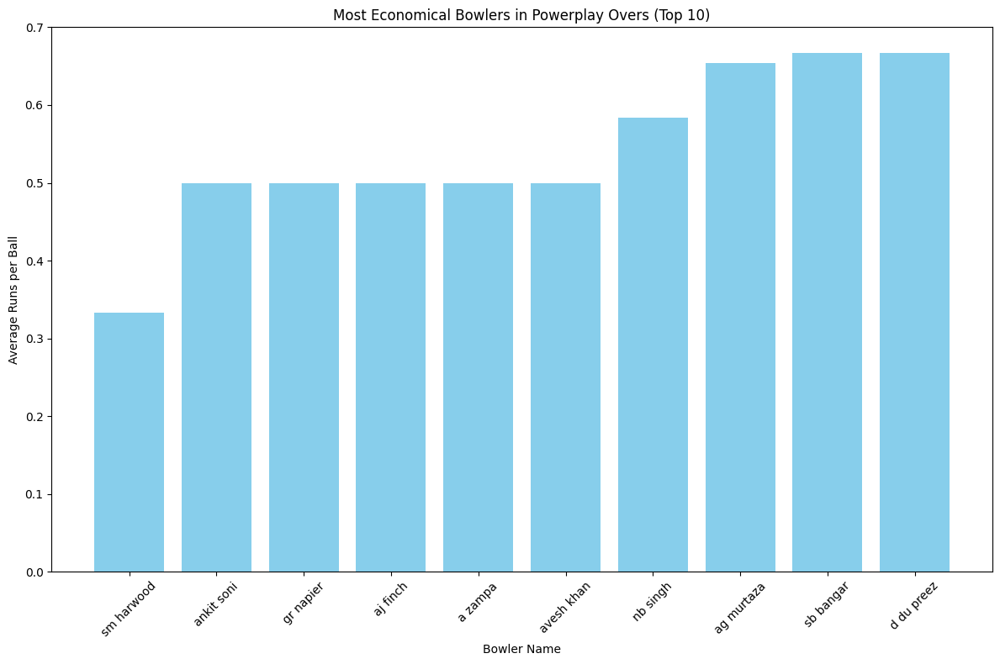

In [0]:
import matplotlib.pyplot as plt


# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib
plt.figure(figsize=(12, 8))
# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_runs_per_ball'], color='skyblue')
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (Top 10)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Impact of Winning Toss on Match Outcomes

In [0]:
toss_impact_individual_matches = spark.sql("""
SELECT m.match_id, m.toss_winner, m.toss_name, m.match_winner,
       CASE WHEN m.toss_winner = m.match_winner THEN 'Won' ELSE 'Lost' END AS match_outcome
FROM match m
WHERE m.toss_name IS NOT NULL
ORDER BY m.match_id
""")
toss_impact_individual_matches.show()


+--------+--------------------+---------+--------------------+-------------+
|match_id|         toss_winner|toss_name|        match_winner|match_outcome|
+--------+--------------------+---------+--------------------+-------------+
|  335987|Royal Challengers...|    field|Kolkata Knight Ri...|         Lost|
|  335988| Chennai Super Kings|      bat| Chennai Super Kings|          Won|
|  335989|    Rajasthan Royals|      bat|    Delhi Daredevils|         Lost|
|  335990|      Mumbai Indians|      bat|Royal Challengers...|         Lost|
|  335991|     Deccan Chargers|      bat|Kolkata Knight Ri...|         Lost|
|  335992|     Kings XI Punjab|      bat|    Rajasthan Royals|         Lost|
|  335993|     Deccan Chargers|      bat|    Delhi Daredevils|         Lost|
|  335994|      Mumbai Indians|    field| Chennai Super Kings|         Lost|
|  335995|    Rajasthan Royals|    field|    Rajasthan Royals|          Won|
|  335996|      Mumbai Indians|    field|     Kings XI Punjab|         Lost|

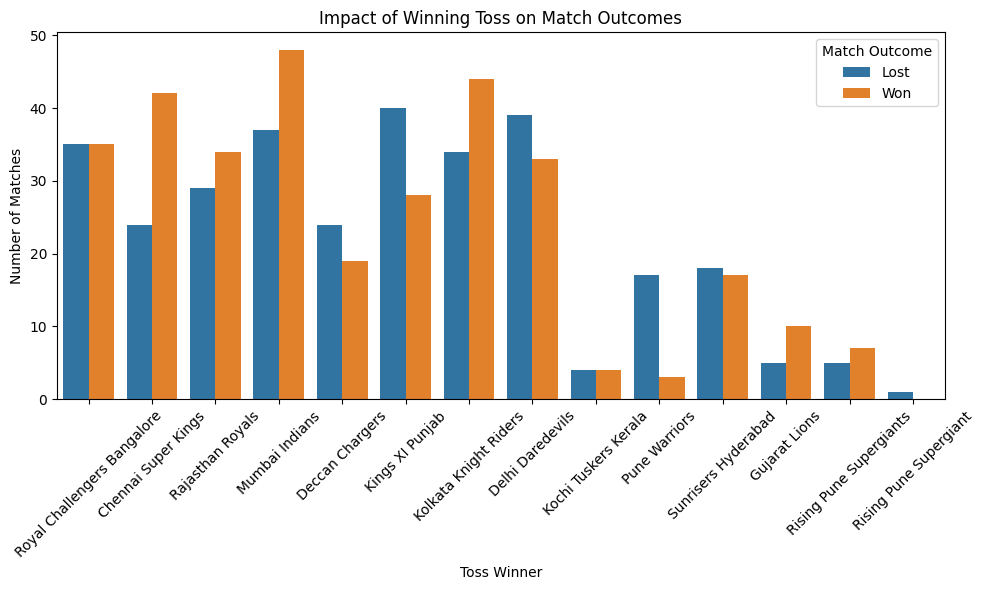

In [0]:
import seaborn as sns

toss_impact_pd = toss_impact_individual_matches.toPandas()

# Creating a countplot to show win/loss after winning toss
plt.figure(figsize=(10, 6))
sns.countplot(x='toss_winner', hue='match_outcome', data=toss_impact_pd)
plt.title('Impact of Winning Toss on Match Outcomes')
plt.xlabel('Toss Winner')
plt.ylabel('Number of Matches')
plt.legend(title='Match Outcome')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)

In [0]:
average_runs_in_wins = spark.sql("""
SELECT p.player_name, AVG(b.runs_scored) AS avg_runs_in_wins, COUNT(*) AS innings_played
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.striker = pm.player_id
JOIN player p ON pm.player_id = p.player_id
JOIN match m ON pm.match_id = m.match_id
WHERE m.match_winner = pm.player_team
GROUP BY p.player_name
ORDER BY avg_runs_in_wins ASC
""")
average_runs_in_wins.show()

+-----------------+-------------------+--------------+
|      player_name|   avg_runs_in_wins|innings_played|
+-----------------+-------------------+--------------+
|        jj bumrah|                0.0|             2|
|         j theron|                0.0|             1|
|         i sharma|                0.0|             1|
|        sn thakur|                0.0|             2|
|          a nehra|                0.0|             2|
|         ts mills|                0.0|             3|
|       kp appanna|                0.0|             1|
|         vr aaron|                0.0|             5|
|    anirudh singh|                0.0|             1|
|       t thushara|                0.2|             5|
|        sa abbott|               0.25|             4|
|    yashpal singh| 0.3157894736842105|            19|
|      kc cariappa| 0.3333333333333333|             3|
|      s sreesanth| 0.3333333333333333|             3|
|       jd unadkat|                0.4|             5|
|       sm

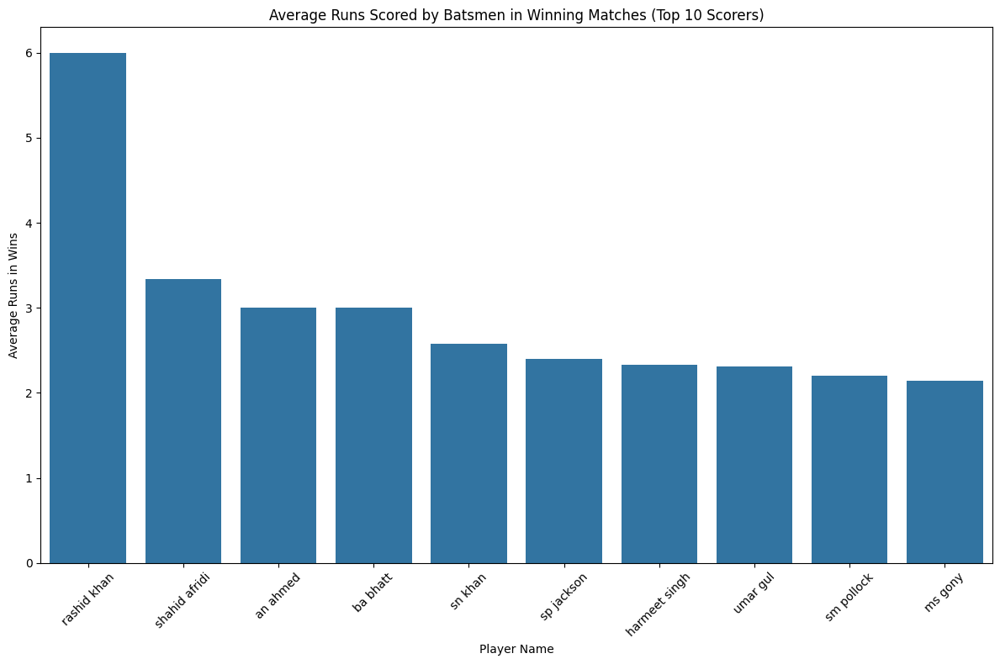

In [0]:
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Distribution of Scores by Venue

In [0]:
# Execute SQL Query
scores_by_venue = spark.sql("""
SELECT venue_name, AVG(total_runs) AS average_score, MAX(total_runs) AS highest_score
FROM (
    SELECT ball_by_ball.match_id, match.venue_name, SUM(runs_scored) AS total_runs
    FROM ball_by_ball
    JOIN match ON ball_by_ball.match_id = match.match_id
    GROUP BY ball_by_ball.match_id, match.venue_name
)
GROUP BY venue_name
ORDER BY average_score DESC
""")

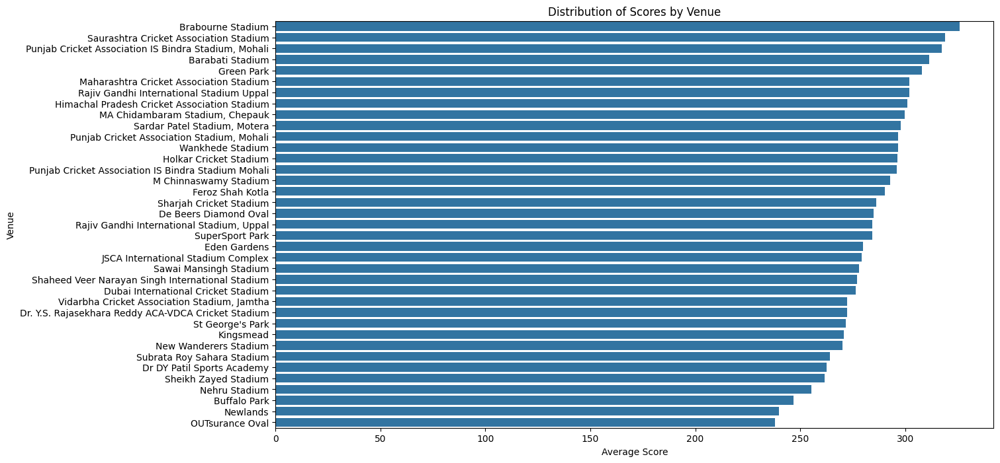

In [0]:
# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()

Dissimal Types 

In [0]:
# Execute SQL Query
dismissal_types = spark.sql("""
SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC
""")

/home/spark-d6f26f2d-e980-4880-a01b-d4/.ipykernel/2598/command-8095816796172528-169784400:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')


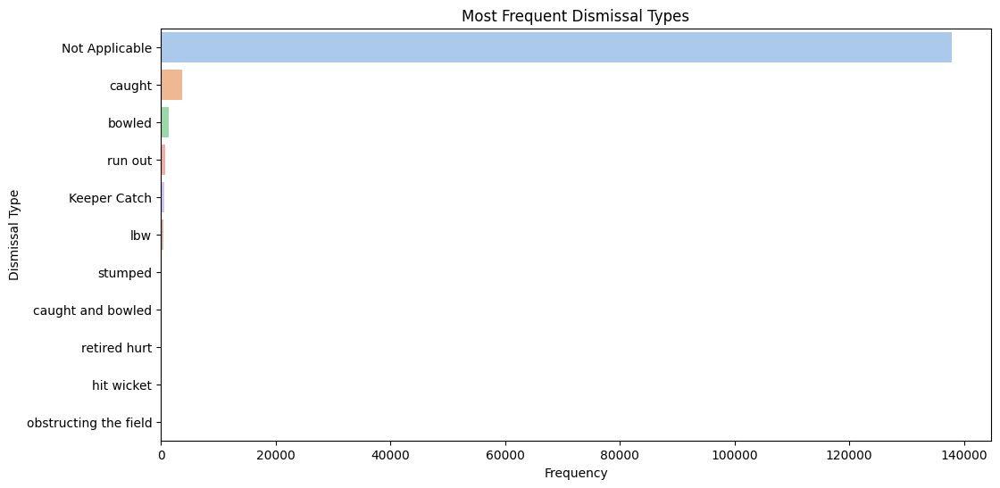

In [0]:
# Convert to Pandas DataFrame
dismissal_types_pd = dismissal_types.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types')
plt.xlabel('Frequency')
plt.ylabel('Dismissal Type')
plt.show()

Team Toss Win Performance

In [0]:
# Execute SQL Query
team_toss_win_performance = spark.sql("""
SELECT team1, COUNT(*) AS matches_played, SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM match
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")

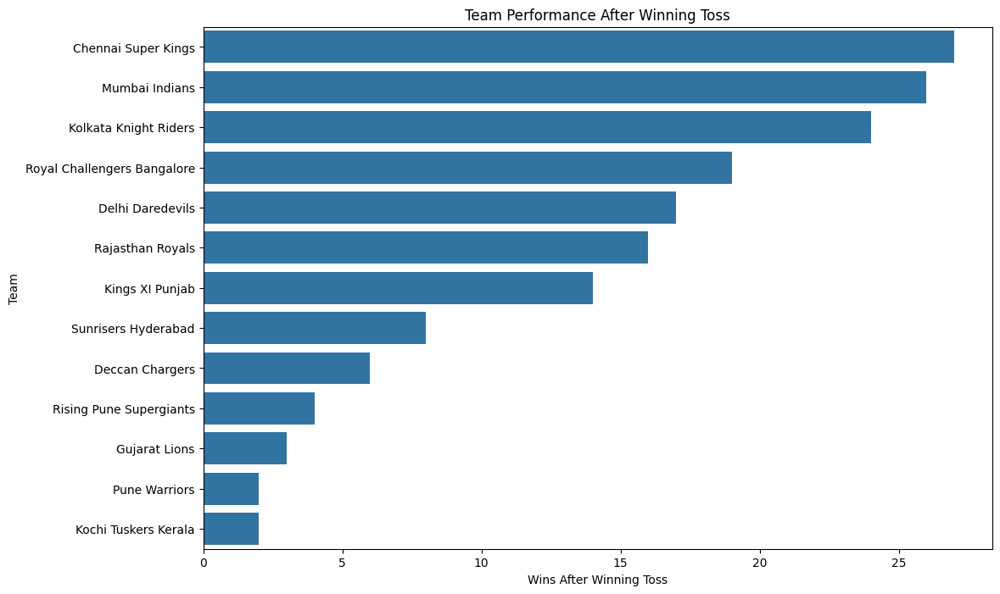

In [0]:
# Convert to Pandas DataFrame
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()